In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.1 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [34 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/tmp/pip-install-zxtfsau_/pyyaml_8efb05888c17487289f6c898063a881f/setup.py", line 291, in <module>
          setup(
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 185, in setup
          return run_commands(dist)
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 201, in run_commands
          dist.run_commands()
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/dist.py", line 969, in run_commands
          self.run_command(cmd)
        File "/opt/conda

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [4]:
!kaggle datasets download -d tannergi/chess-piece-detection

Dataset URL: https://www.kaggle.com/datasets/tannergi/chess-piece-detection
License(s): Attribution 4.0 International (CC BY 4.0)
 93%|█████████████████████████████████████▎  | 155M/166M [00:02<00:00, 72.9MB/s]
100%|████████████████████████████████████████| 166M/166M [00:02<00:00, 77.6MB/s]


In [5]:
!unzip chess-piece-detection.zip

Archive:  chess-piece-detection.zip
  inflating: Chess Detection/annotations/IMG_1989.xml  
  inflating: Chess Detection/annotations/IMG_1990.xml  
  inflating: Chess Detection/annotations/IMG_1991.xml  
  inflating: Chess Detection/annotations/IMG_1992.xml  
  inflating: Chess Detection/annotations/IMG_1993.xml  
  inflating: Chess Detection/annotations/IMG_1994.xml  
  inflating: Chess Detection/annotations/IMG_1995.xml  
  inflating: Chess Detection/annotations/IMG_1996.xml  
  inflating: Chess Detection/annotations/IMG_1997.xml  
  inflating: Chess Detection/annotations/IMG_1998.xml  
  inflating: Chess Detection/annotations/IMG_1999.xml  
  inflating: Chess Detection/annotations/IMG_2000.xml  
  inflating: Chess Detection/annotations/IMG_2001.xml  
  inflating: Chess Detection/annotations/IMG_2002.xml  
  inflating: Chess Detection/annotations/IMG_2003.xml  
  inflating: Chess Detection/annotations/IMG_2004.xml  
  inflating: Chess Detection/annotations/IMG_2005.xml  
  inflating:

In [6]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2
import xml.etree.ElementTree as ET


# write a function that loads the dataset into detectron2's standard format
def get_dataset_dicts(annotation_path, image_path):
    classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

    dataset_dicts = []
    for idx, filename in enumerate(os.listdir(annotation_path)):
        record = {}
        root = ET.parse(os.path.join(annotation_path, filename)).getroot()
        record["file_name"] = os.path.join(image_path, root.find('filename').text)
        record["height"] = 2248
        record["width"] = 4000

        objs = []
        for member in root.findall('object'):
          obj = {
              'bbox': [int(member[4][0].text), int(member[4][1].text), int(member[4][2].text), int(member[4][3].text)],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': classes.index(member[0].text),
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [7]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

DatasetCatalog.register('chess_piece_dataset', lambda: get_dataset_dicts('Chess Detection/annotations', 'Chess Detection/images'))
MetadataCatalog.get('chess_piece_dataset').set(thing_classes=classes)
chess_metadata = MetadataCatalog.get('chess_piece_dataset')

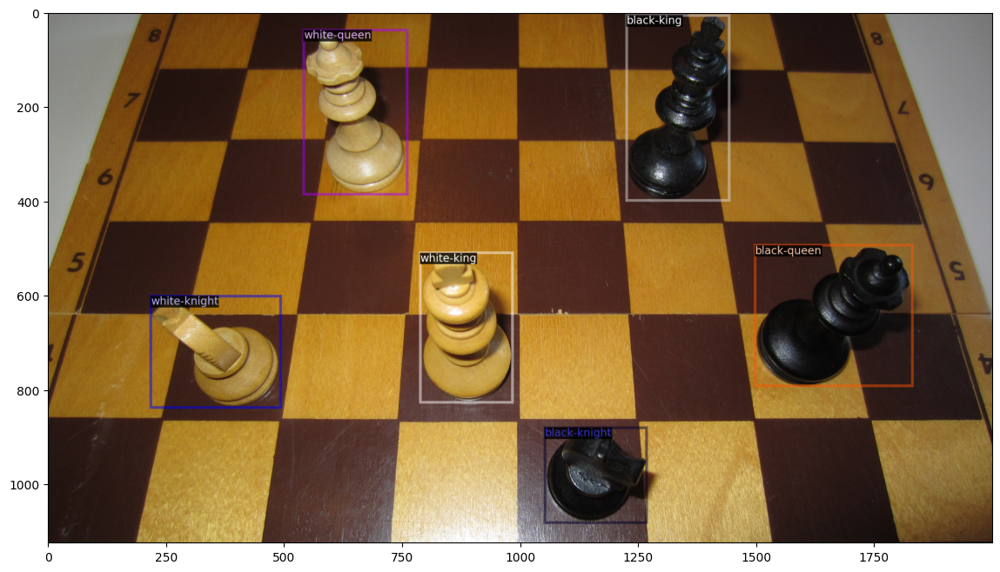

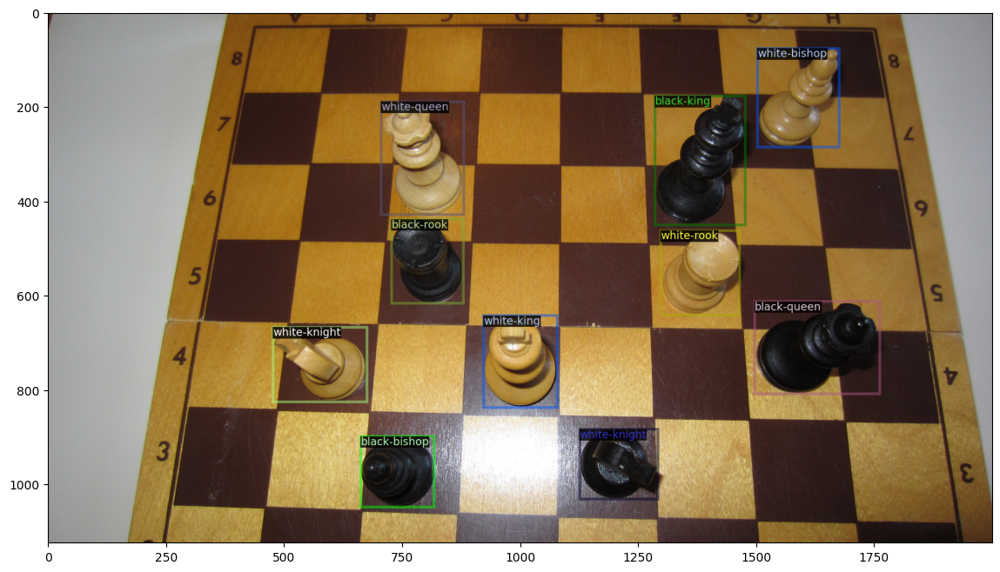

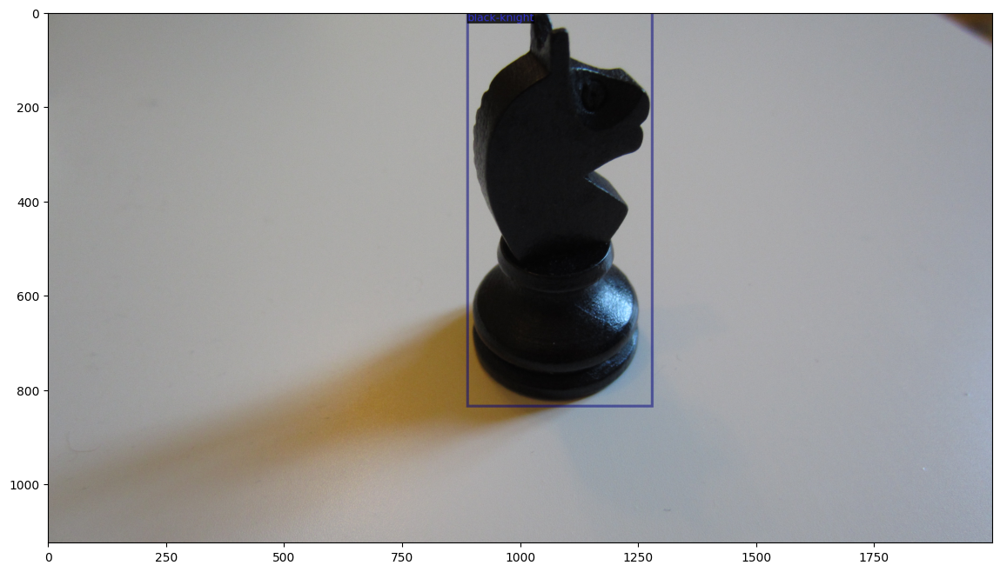

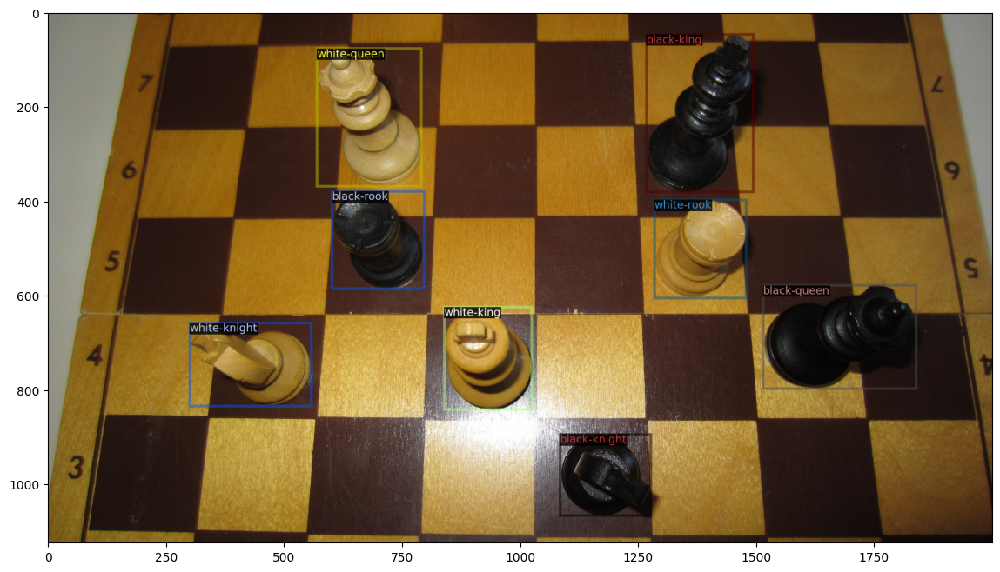

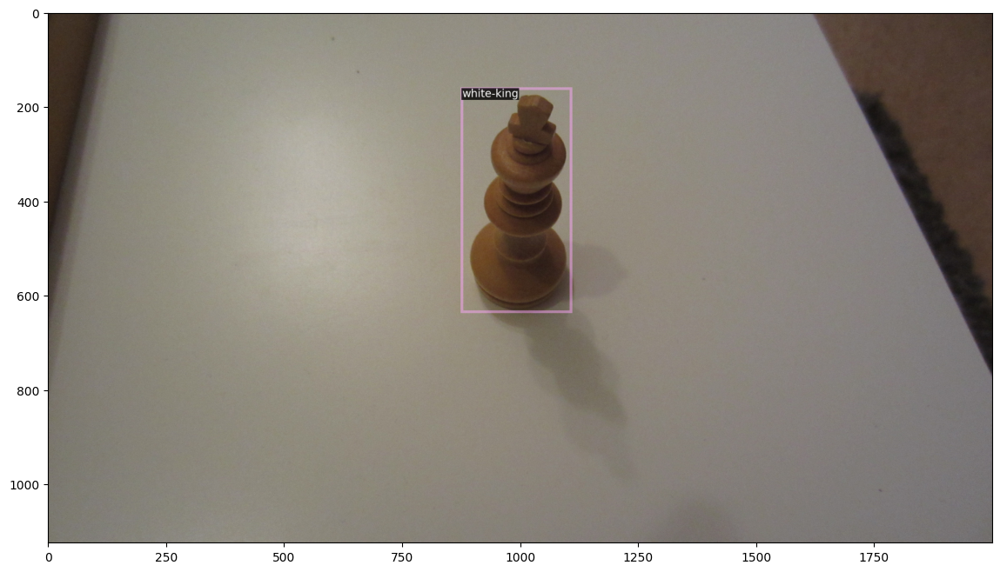

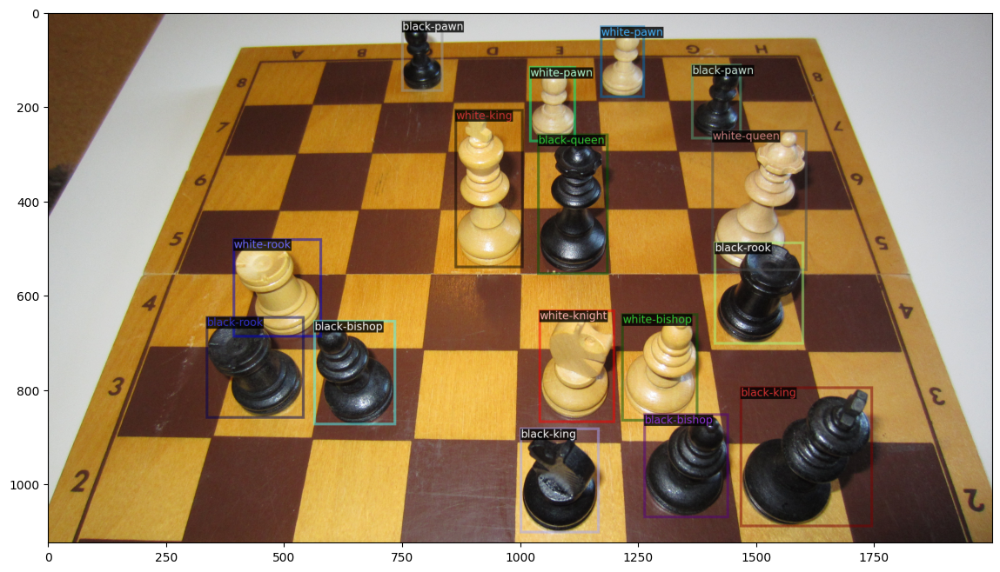

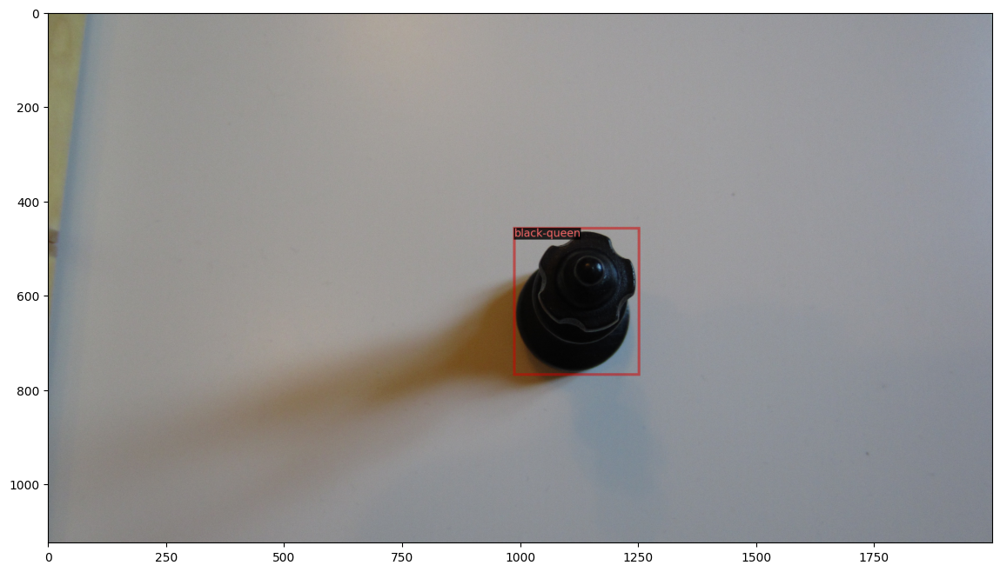

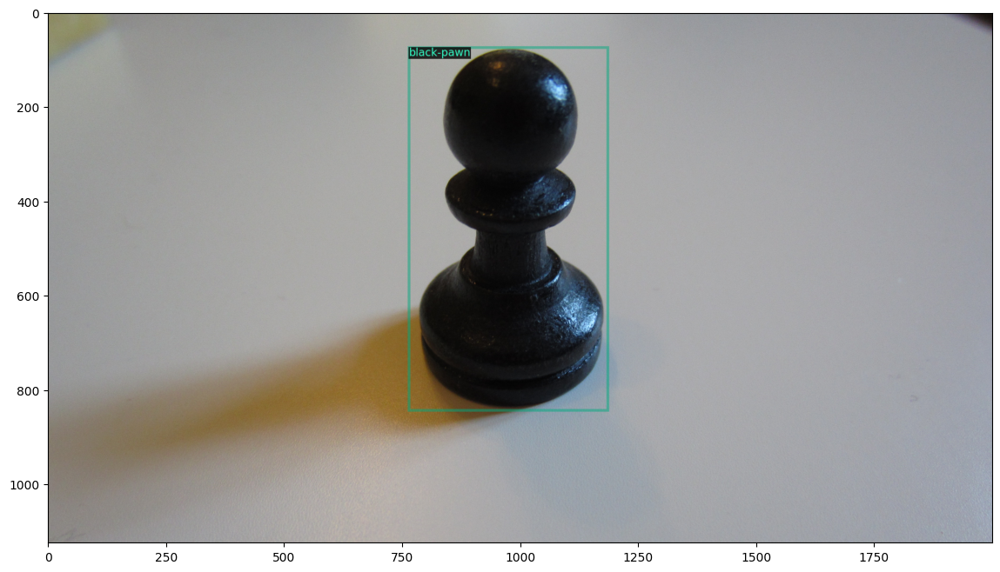

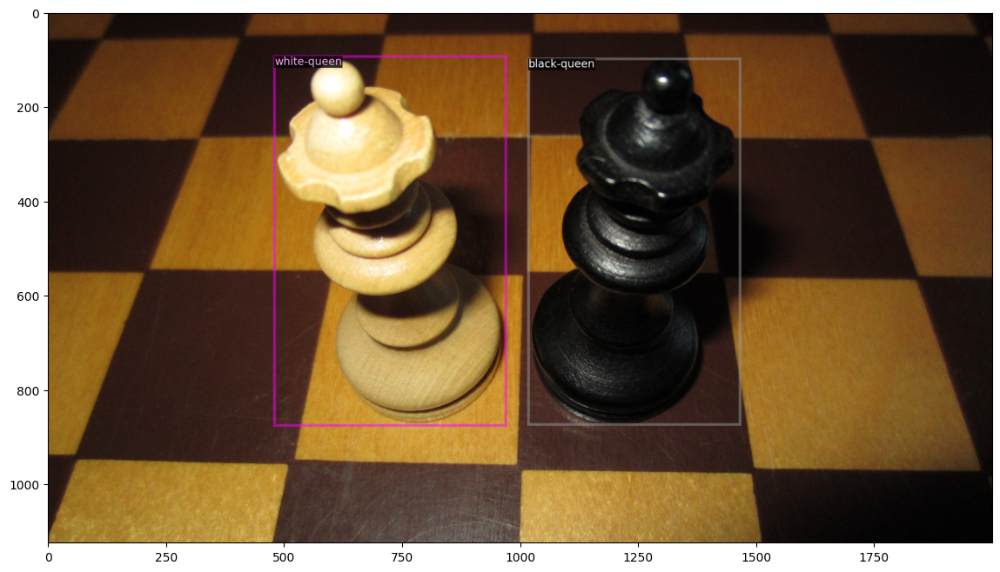

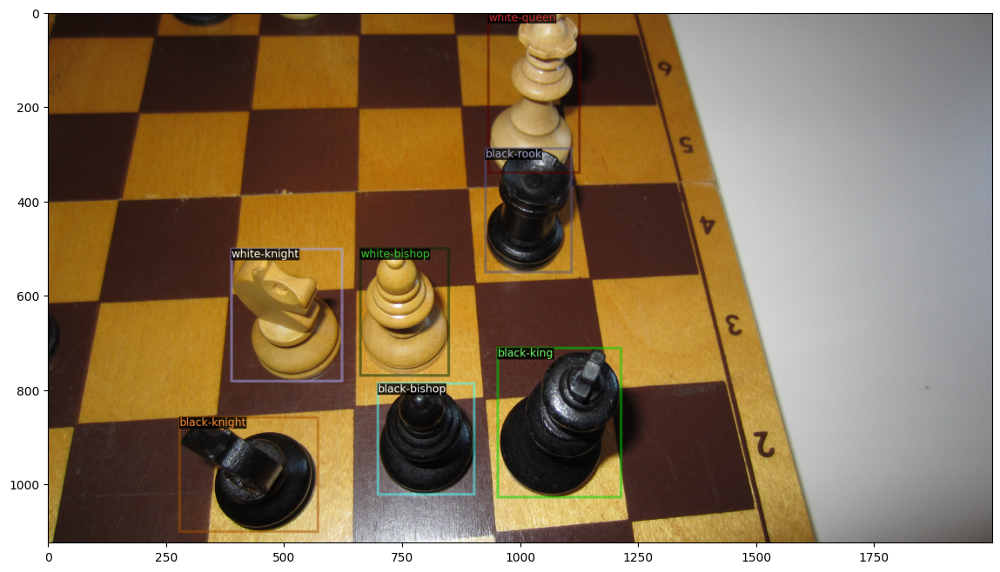

In [8]:
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('chess_piece_dataset')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=chess_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [9]:
import os
import logging
import time
from detectron2.engine import DefaultTrainer, HookBase
from detectron2.config import get_cfg
from detectron2 import model_zoo
from tabulate import tabulate
from detectron2.data import DatasetCatalog, MetadataCatalog

# Configure logging
log_file = 'training_log.txt'
logging.basicConfig(filename=log_file, level=logging.INFO)

# Print message to console to confirm logging setup
print(f"Logging to {log_file}")

# List of learning rates to experiment with
learning_rates = [0.001, 0.005, 0.01]

# Number of iterations and runs
num_iterations = 1000
num_runs = 10

# Data structure to store results
results = []

# Custom hook to log the training progress
class LossLoggerHook(HookBase):
    def __init__(self):
        super().__init__()

    def after_step(self):
        if self.trainer.storage.iter % 20 == 0:  # Log every 20 iterations
            total_loss = self.trainer.storage.history("total_loss").latest()
            logging.info(f"iter: {self.trainer.storage.iter} total_loss: {total_loss}")
            print(f"Logged iteration {self.trainer.storage.iter}")

# Function to train with a specific learning rate
def train_with_learning_rate(lr):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
    cfg.DATASETS.TRAIN = ('chess_piece_dataset',)
    cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.MAX_ITER = num_iterations
    cfg.SOLVER.STEPS = []  # do not decay learning rate
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12
    cfg.SOLVER.BASE_LR = lr  # Set learning rate

    # Implement gradient clipping correctly
    cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "norm"
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_VALUE = 1.0

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.register_hooks([LossLoggerHook()])

    start_time = time.time()
    trainer.resume_or_load(resume=False)
    trainer.train()
    end_time = time.time()

    # Get the minimum loss over all iterations
    min_loss = min(trainer.storage.history("total_loss").values())

    return min_loss, end_time - start_time

# Run training for each learning rate
for lr in learning_rates:
    lr_results = []
    for run in range(num_runs):
        logging.info(f"Starting training with learning rate: {lr}, run: {run + 1}")
        print(f"Starting training with learning rate: {lr}, run: {run + 1}")
        min_loss, duration = train_with_learning_rate(lr)
        lr_results.append([lr, run + 1, min_loss, duration])
    results.extend(lr_results)

# Aggregate results for each learning rate
summary_results = []
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    min_loss = min(lr_runs, key=lambda x: x[2])[2]
    total_time = sum(run[3] for run in lr_runs)
    summary_results.append([lr, min_loss, total_time])

# Tabulate the detailed results for each run
headers = ["Learning Rate", "Run", "Minimum Loss", "Duration (s)"]
print(tabulate(results, headers, floatfmt=".6f"))

# Log the detailed results to the file
logging.info(tabulate(results, headers, floatfmt=".6f"))

# Tabulate and print the summary results
summary_headers = ["Learning Rate", "Minimum Loss", "Total Time (s)"]
print(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Log the summary results to the file
logging.info(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Tabulate the detailed results for each learning rate
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    print(f"\nDetailed results for learning rate: {lr}")
    print(tabulate(lr_runs, headers, floatfmt=".6f"))
    logging.info(f"\nDetailed results for learning rate: {lr}")
    logging.info(tabulate(lr_runs, headers, floatfmt=".6f"))


Logging to training_log.txt
Starting training with learning rate: 0.001, run: 1
[06/03 13:20:28 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (nor

model_final_971ab9.pkl: 228MB [00:01, 161MB/s]                               


[06/03 13:20:30 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Logged iteration 0
[06/03 13:20:46 d2.utils.events]:  eta: 0:07:57  iter: 19  total_loss: 2.263  loss_cls: 2.123  loss_box_reg: 0.1946    time: 0.6197  last_time: 0.4731  data_time: 0.0414  last_data_time: 0.0062   lr: 1.9981e-05  max_mem: 4465M


2024-06-03 13:20:48.388039: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-03 13:20:48.388168: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-03 13:20:48.513646: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Logged iteration 20
[06/03 13:21:06 d2.utils.events]:  eta: 0:07:43  iter: 39  total_loss: 1.171  loss_cls: 1.089  loss_box_reg: 0.1106    time: 0.5349  last_time: 0.4400  data_time: 0.0063  last_data_time: 0.0061   lr: 3.9961e-05  max_mem: 4472M
Logged iteration 40
[06/03 13:21:16 d2.utils.events]:  eta: 0:07:34  iter: 59  total_loss: 1.002  loss_cls: 0.9388  loss_box_reg: 0.07305    time: 0.5156  last_time: 0.4081  data_time: 0.0177  last_data_time: 0.0071   lr: 5.9941e-05  max_mem: 4472M
Logged iteration 60
[06/03 13:21:26 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.6544  loss_cls: 0.585  loss_box_reg: 0.07246    time: 0.5095  last_time: 0.4188  data_time: 0.0239  last_data_time: 0.0060   lr: 7.9921e-05  max_mem: 4474M
Logged iteration 80
[06/03 13:21:35 d2.utils.events]:  eta: 0:07:15  iter: 99  total_loss: 0.4472  loss_cls: 0.3673  loss_box_reg: 0.0605    time: 0.5008  last_time: 0.4707  data_time: 0.0122  last_data_time: 0.0069   lr: 9.9901e-05  max_mem: 4474M
Logged

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 13:28:56 d2.utils.events]:  eta: 0:07:49  iter: 19  total_loss: 1.737  loss_cls: 1.623  loss_box_reg: 0.151    time: 0.4747  last_time: 0.4328  data_time: 0.0549  last_data_time: 0.0068   lr: 1.9981e-05  max_mem: 4478M
Logged iteration 20
[06/03 13:29:06 d2.utils.events]:  eta: 0:07:44  iter: 39  total_loss: 1.767  loss_cls: 1.643  loss_box_reg: 0.1183    time: 0.4747  last_time: 0.3788  data_time: 0.0146  last_data_time: 0.0065   lr: 3.9961e-05  max_mem: 4478M
Logged iteration 40
[06/03 13:29:16 d2.utils.events]:  eta: 0:07:36  iter: 59  total_loss: 0.7582  loss_cls: 0.6974  loss_box_reg: 0.07695    time: 0.4798  last_time: 0.4420  data_time: 0.0213  last_data_time: 0.0059   lr: 5.9941e-05  max_mem: 4478M
Logged iteration 60
[06/03 13:29:25 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.7112  loss_cls: 0.6099  loss_box_reg: 0.07357    time: 0.4793  last_time: 0.4860  data_time: 0.0179  last_data_time: 0.0064   lr: 7.9921e-05  max_mem: 4478M
Logged i

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 3
[06/03 13:36:53 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 13:37:03 d2.utils.events]:  eta: 0:07:58  iter: 19  total_loss: 2.117  loss_cls: 1.887  loss_box_reg: 0.2398    time: 0.4837  last_time: 0.4862  data_time: 0.0417  last_data_time: 0.0062   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 13:37:13 d2.utils.events]:  eta: 0:07:47  iter: 39  total_loss: 1.175  loss_cls: 1.08  loss_box_reg: 0.0905    time: 0.4846  last_time: 0.4836  data_time: 0.0201  last_data_time: 0.0060   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 13:37:23 d2.utils.events]:  eta: 0:07:38  iter: 59  total_loss: 0.7955  loss_cls: 0.7382  loss_box_reg: 0.07181    time: 0.4869  last_time: 0.4827  data_time: 0.0160  last_data_time: 0.0137   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 13:37:32 d2.utils.events]:  eta: 0:07:28  iter: 79  total_loss: 0.7156  loss_cls: 0.6492  loss_box_reg: 0.06875    time: 0.4842  last_time: 0.4841  data_time: 0.0096  last_data_time: 0.0072   lr: 7.9921e-05  max_mem: 4482M
Logged i

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 4
[06/03 13:44:57 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 13:45:07 d2.utils.events]:  eta: 0:07:47  iter: 19  total_loss: 2.401  loss_cls: 2.203  loss_box_reg: 0.2147    time: 0.4685  last_time: 0.5202  data_time: 0.0611  last_data_time: 0.0883   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 13:45:17 d2.utils.events]:  eta: 0:07:48  iter: 39  total_loss: 1.635  loss_cls: 1.463  loss_box_reg: 0.1373    time: 0.4736  last_time: 0.4913  data_time: 0.0088  last_data_time: 0.0060   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 13:45:27 d2.utils.events]:  eta: 0:07:38  iter: 59  total_loss: 0.6705  loss_cls: 0.6165  loss_box_reg: 0.04406    time: 0.4772  last_time: 0.5166  data_time: 0.0170  last_data_time: 0.0538   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 13:45:36 d2.utils.events]:  eta: 0:07:28  iter: 79  total_loss: 0.7965  loss_cls: 0.7017  loss_box_reg: 0.09615    time: 0.4774  last_time: 0.4035  data_time: 0.0295  last_data_time: 0.0067   lr: 7.9921e-05  max_mem: 4482M
Logged 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 5
[06/03 13:53:01 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 13:53:12 d2.utils.events]:  eta: 0:08:05  iter: 19  total_loss: 1.804  loss_cls: 1.645  loss_box_reg: 0.1518    time: 0.5139  last_time: 0.4842  data_time: 0.0688  last_data_time: 0.0053   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 13:53:22 d2.utils.events]:  eta: 0:07:45  iter: 39  total_loss: 1.004  loss_cls: 0.9091  loss_box_reg: 0.09729    time: 0.4918  last_time: 0.4903  data_time: 0.0131  last_data_time: 0.0067   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 13:53:31 d2.utils.events]:  eta: 0:07:35  iter: 59  total_loss: 0.8656  loss_cls: 0.7897  loss_box_reg: 0.08454    time: 0.4816  last_time: 0.4862  data_time: 0.0110  last_data_time: 0.0052   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 13:53:41 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.7613  loss_cls: 0.6486  loss_box_reg: 0.07889    time: 0.4826  last_time: 0.4702  data_time: 0.0087  last_data_time: 0.0064   lr: 7.9921e-05  max_mem: 4482M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 6
[06/03 14:01:05 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:01:16 d2.utils.events]:  eta: 0:07:50  iter: 19  total_loss: 2.047  loss_cls: 1.826  loss_box_reg: 0.2039    time: 0.4720  last_time: 0.4722  data_time: 0.0459  last_data_time: 0.0065   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:01:25 d2.utils.events]:  eta: 0:07:43  iter: 39  total_loss: 1.096  loss_cls: 1.012  loss_box_reg: 0.08279    time: 0.4728  last_time: 0.4830  data_time: 0.0188  last_data_time: 0.0064   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 14:01:35 d2.utils.events]:  eta: 0:07:34  iter: 59  total_loss: 0.9812  loss_cls: 0.9193  loss_box_reg: 0.07352    time: 0.4774  last_time: 0.5378  data_time: 0.0250  last_data_time: 0.0418   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 14:01:44 d2.utils.events]:  eta: 0:07:25  iter: 79  total_loss: 0.6072  loss_cls: 0.549  loss_box_reg: 0.05053    time: 0.4771  last_time: 0.4083  data_time: 0.0162  last_data_time: 0.0065   lr: 7.9921e-05  max_mem: 4482M
Logged 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 7
[06/03 14:09:08 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:09:19 d2.utils.events]:  eta: 0:08:02  iter: 19  total_loss: 1.796  loss_cls: 1.612  loss_box_reg: 0.1995    time: 0.4952  last_time: 0.4755  data_time: 0.0679  last_data_time: 0.0059   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:09:29 d2.utils.events]:  eta: 0:07:45  iter: 39  total_loss: 1.726  loss_cls: 1.614  loss_box_reg: 0.1033    time: 0.4854  last_time: 0.4690  data_time: 0.0117  last_data_time: 0.0065   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 14:09:38 d2.utils.events]:  eta: 0:07:37  iter: 59  total_loss: 0.8392  loss_cls: 0.7939  loss_box_reg: 0.06277    time: 0.4851  last_time: 0.4444  data_time: 0.0261  last_data_time: 0.0077   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 14:09:48 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.6066  loss_cls: 0.531  loss_box_reg: 0.08417    time: 0.4812  last_time: 0.4877  data_time: 0.0149  last_data_time: 0.0055   lr: 7.9921e-05  max_mem: 4482M
Logged i

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 8
[06/03 14:17:13 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:17:24 d2.utils.events]:  eta: 0:07:57  iter: 19  total_loss: 1.973  loss_cls: 1.81  loss_box_reg: 0.1577    time: 0.4960  last_time: 0.5579  data_time: 0.0564  last_data_time: 0.0923   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:17:34 d2.utils.events]:  eta: 0:07:45  iter: 39  total_loss: 0.973  loss_cls: 0.915  loss_box_reg: 0.05802    time: 0.4974  last_time: 0.4848  data_time: 0.0263  last_data_time: 0.0066   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 14:17:44 d2.utils.events]:  eta: 0:07:35  iter: 59  total_loss: 1.203  loss_cls: 1.107  loss_box_reg: 0.08598    time: 0.4889  last_time: 0.4274  data_time: 0.0100  last_data_time: 0.0072   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 14:17:53 d2.utils.events]:  eta: 0:07:25  iter: 79  total_loss: 0.6842  loss_cls: 0.6061  loss_box_reg: 0.07676    time: 0.4854  last_time: 0.4875  data_time: 0.0235  last_data_time: 0.0064   lr: 7.9921e-05  max_mem: 4482M
Logged it

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 9
[06/03 14:25:20 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:25:31 d2.utils.events]:  eta: 0:08:14  iter: 19  total_loss: 2.689  loss_cls: 2.465  loss_box_reg: 0.1804    time: 0.5011  last_time: 0.5155  data_time: 0.0655  last_data_time: 0.0350   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:25:40 d2.utils.events]:  eta: 0:07:45  iter: 39  total_loss: 1.174  loss_cls: 1.036  loss_box_reg: 0.07369    time: 0.4888  last_time: 0.4171  data_time: 0.0084  last_data_time: 0.0057   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 14:25:50 d2.utils.events]:  eta: 0:07:36  iter: 59  total_loss: 1.088  loss_cls: 1.016  loss_box_reg: 0.07111    time: 0.4876  last_time: 0.4875  data_time: 0.0184  last_data_time: 0.0082   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 14:25:59 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.5939  loss_cls: 0.499  loss_box_reg: 0.08179    time: 0.4852  last_time: 0.4899  data_time: 0.0077  last_data_time: 0.0068   lr: 7.9921e-05  max_mem: 4482M
Logged it

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 10
[06/03 14:33:26 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:33:37 d2.utils.events]:  eta: 0:07:54  iter: 19  total_loss: 1.554  loss_cls: 1.414  loss_box_reg: 0.14    time: 0.5045  last_time: 0.4771  data_time: 0.0558  last_data_time: 0.0070   lr: 1.9981e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:33:46 d2.utils.events]:  eta: 0:07:45  iter: 39  total_loss: 1.198  loss_cls: 1.09  loss_box_reg: 0.09315    time: 0.4907  last_time: 0.4885  data_time: 0.0127  last_data_time: 0.0066   lr: 3.9961e-05  max_mem: 4482M
Logged iteration 40
[06/03 14:33:56 d2.utils.events]:  eta: 0:07:36  iter: 59  total_loss: 1.041  loss_cls: 0.9709  loss_box_reg: 0.06316    time: 0.4874  last_time: 0.4928  data_time: 0.0133  last_data_time: 0.0124   lr: 5.9941e-05  max_mem: 4482M
Logged iteration 60
[06/03 14:34:06 d2.utils.events]:  eta: 0:07:27  iter: 79  total_loss: 0.6033  loss_cls: 0.5147  loss_box_reg: 0.06615    time: 0.4888  last_time: 0.4832  data_time: 0.0277  last_data_time: 0.0071   lr: 7.9921e-05  max_mem: 4482M
Logged ite

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 1
[06/03 14:41:36 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:41:46 d2.utils.events]:  eta: 0:07:59  iter: 19  total_loss: 1.175  loss_cls: 1.066  loss_box_reg: 0.1118    time: 0.4903  last_time: 0.4884  data_time: 0.0530  last_data_time: 0.0072   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:41:56 d2.utils.events]:  eta: 0:07:47  iter: 39  total_loss: 1.272  loss_cls: 1.14  loss_box_reg: 0.09294    time: 0.4791  last_time: 0.4194  data_time: 0.0180  last_data_time: 0.0082   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 14:42:06 d2.utils.events]:  eta: 0:07:39  iter: 59  total_loss: 0.326  loss_cls: 0.2747  loss_box_reg: 0.0454    time: 0.4818  last_time: 0.4943  data_time: 0.0284  last_data_time: 0.0102   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 14:42:15 d2.utils.events]:  eta: 0:07:27  iter: 79  total_loss: 0.464  loss_cls: 0.391  loss_box_reg: 0.07128    time: 0.4813  last_time: 0.4094  data_time: 0.0247  last_data_time: 0.0066   lr: 0.00039961  max_mem: 4482M
Logged iterat

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 2
[06/03 14:49:40 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:49:51 d2.utils.events]:  eta: 0:07:58  iter: 19  total_loss: 1.913  loss_cls: 1.751  loss_box_reg: 0.1282    time: 0.4894  last_time: 0.4885  data_time: 0.0408  last_data_time: 0.0057   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:50:01 d2.utils.events]:  eta: 0:07:47  iter: 39  total_loss: 0.8585  loss_cls: 0.7824  loss_box_reg: 0.09137    time: 0.4859  last_time: 0.5015  data_time: 0.0179  last_data_time: 0.0139   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 14:50:10 d2.utils.events]:  eta: 0:07:37  iter: 59  total_loss: 0.4528  loss_cls: 0.4026  loss_box_reg: 0.05578    time: 0.4823  last_time: 0.4878  data_time: 0.0103  last_data_time: 0.0070   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 14:50:20 d2.utils.events]:  eta: 0:07:27  iter: 79  total_loss: 0.2947  loss_cls: 0.2461  loss_box_reg: 0.04591    time: 0.4785  last_time: 0.4201  data_time: 0.0158  last_data_time: 0.0055   lr: 0.00039961  max_mem: 4482M
Logged

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 3
[06/03 14:57:44 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 14:57:54 d2.utils.events]:  eta: 0:07:55  iter: 19  total_loss: 1.665  loss_cls: 1.549  loss_box_reg: 0.1194    time: 0.4877  last_time: 0.4795  data_time: 0.0503  last_data_time: 0.0054   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 14:58:04 d2.utils.events]:  eta: 0:07:43  iter: 39  total_loss: 0.8327  loss_cls: 0.7517  loss_box_reg: 0.07279    time: 0.4826  last_time: 0.5395  data_time: 0.0322  last_data_time: 0.0618   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 14:58:13 d2.utils.events]:  eta: 0:07:36  iter: 59  total_loss: 0.2849  loss_cls: 0.2459  loss_box_reg: 0.04022    time: 0.4803  last_time: 0.4874  data_time: 0.0122  last_data_time: 0.0056   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 14:58:23 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.3728  loss_cls: 0.3154  loss_box_reg: 0.05732    time: 0.4780  last_time: 0.4935  data_time: 0.0082  last_data_time: 0.0064   lr: 0.00039961  max_mem: 4482M
Logged

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 4
[06/03 15:05:51 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:06:02 d2.utils.events]:  eta: 0:07:59  iter: 19  total_loss: 1.93  loss_cls: 1.812  loss_box_reg: 0.1165    time: 0.4828  last_time: 0.4931  data_time: 0.0634  last_data_time: 0.0062   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 15:06:11 d2.utils.events]:  eta: 0:07:48  iter: 39  total_loss: 0.8523  loss_cls: 0.7762  loss_box_reg: 0.07826    time: 0.4773  last_time: 0.4932  data_time: 0.0159  last_data_time: 0.0271   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 15:06:21 d2.utils.events]:  eta: 0:07:38  iter: 59  total_loss: 0.3889  loss_cls: 0.3327  loss_box_reg: 0.05351    time: 0.4817  last_time: 0.5458  data_time: 0.0328  last_data_time: 0.0495   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 15:06:31 d2.utils.events]:  eta: 0:07:29  iter: 79  total_loss: 0.2726  loss_cls: 0.2388  loss_box_reg: 0.03699    time: 0.4842  last_time: 0.4636  data_time: 0.0360  last_data_time: 0.0411   lr: 0.00039961  max_mem: 4482M
Logged 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 5
[06/03 15:13:58 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:14:08 d2.utils.events]:  eta: 0:07:59  iter: 19  total_loss: 1.519  loss_cls: 1.42  loss_box_reg: 0.1156    time: 0.4902  last_time: 0.6103  data_time: 0.0534  last_data_time: 0.0998   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 15:14:18 d2.utils.events]:  eta: 0:07:47  iter: 39  total_loss: 0.6175  loss_cls: 0.5687  loss_box_reg: 0.06962    time: 0.4827  last_time: 0.4897  data_time: 0.0093  last_data_time: 0.0065   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 15:14:28 d2.utils.events]:  eta: 0:07:38  iter: 59  total_loss: 0.401  loss_cls: 0.3392  loss_box_reg: 0.04505    time: 0.4856  last_time: 0.4880  data_time: 0.0310  last_data_time: 0.0068   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 15:14:37 d2.utils.events]:  eta: 0:07:29  iter: 79  total_loss: 0.4585  loss_cls: 0.4075  loss_box_reg: 0.06523    time: 0.4854  last_time: 0.5061  data_time: 0.0234  last_data_time: 0.0306   lr: 0.00039961  max_mem: 4482M
Logged i

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 6
[06/03 15:22:05 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:22:15 d2.utils.events]:  eta: 0:07:57  iter: 19  total_loss: 1.594  loss_cls: 1.487  loss_box_reg: 0.1102    time: 0.4858  last_time: 0.4959  data_time: 0.0452  last_data_time: 0.0132   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 15:22:25 d2.utils.events]:  eta: 0:07:46  iter: 39  total_loss: 0.9817  loss_cls: 0.8671  loss_box_reg: 0.09628    time: 0.4872  last_time: 0.4123  data_time: 0.0280  last_data_time: 0.0083   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 15:22:35 d2.utils.events]:  eta: 0:07:37  iter: 59  total_loss: 0.43  loss_cls: 0.368  loss_box_reg: 0.04593    time: 0.4830  last_time: 0.4686  data_time: 0.0149  last_data_time: 0.0057   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 15:22:44 d2.utils.events]:  eta: 0:07:27  iter: 79  total_loss: 0.4134  loss_cls: 0.3572  loss_box_reg: 0.06156    time: 0.4795  last_time: 0.4093  data_time: 0.0190  last_data_time: 0.0057   lr: 0.00039961  max_mem: 4482M
Logged it

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 7
[06/03 15:30:10 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:30:21 d2.utils.events]:  eta: 0:08:00  iter: 19  total_loss: 1.785  loss_cls: 1.652  loss_box_reg: 0.1322    time: 0.4762  last_time: 0.4958  data_time: 0.0493  last_data_time: 0.0075   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 15:30:31 d2.utils.events]:  eta: 0:07:50  iter: 39  total_loss: 0.6081  loss_cls: 0.5431  loss_box_reg: 0.06889    time: 0.4816  last_time: 0.4621  data_time: 0.0282  last_data_time: 0.0307   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 15:30:40 d2.utils.events]:  eta: 0:07:40  iter: 59  total_loss: 0.6386  loss_cls: 0.5596  loss_box_reg: 0.07244    time: 0.4786  last_time: 0.5570  data_time: 0.0120  last_data_time: 0.0609   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 15:30:49 d2.utils.events]:  eta: 0:07:29  iter: 79  total_loss: 0.3022  loss_cls: 0.2617  loss_box_reg: 0.04636    time: 0.4756  last_time: 0.4717  data_time: 0.0142  last_data_time: 0.0062   lr: 0.00039961  max_mem: 4482M
Logged

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 8
[06/03 15:38:17 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:38:28 d2.utils.events]:  eta: 0:07:52  iter: 19  total_loss: 1.719  loss_cls: 1.6  loss_box_reg: 0.107    time: 0.4876  last_time: 0.4074  data_time: 0.0552  last_data_time: 0.0058   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 15:38:38 d2.utils.events]:  eta: 0:07:45  iter: 39  total_loss: 0.9092  loss_cls: 0.8475  loss_box_reg: 0.08885    time: 0.4857  last_time: 0.4847  data_time: 0.0203  last_data_time: 0.0104   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 15:38:47 d2.utils.events]:  eta: 0:07:36  iter: 59  total_loss: 0.4378  loss_cls: 0.3892  loss_box_reg: 0.05941    time: 0.4863  last_time: 0.4964  data_time: 0.0279  last_data_time: 0.0914   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 15:38:57 d2.utils.events]:  eta: 0:07:26  iter: 79  total_loss: 0.4505  loss_cls: 0.3751  loss_box_reg: 0.04591    time: 0.4896  last_time: 0.4095  data_time: 0.0410  last_data_time: 0.0065   lr: 0.00039961  max_mem: 4482M
Logged it

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 9
[06/03 15:46:21 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:46:31 d2.utils.events]:  eta: 0:07:52  iter: 19  total_loss: 1.8  loss_cls: 1.671  loss_box_reg: 0.1362    time: 0.4732  last_time: 0.3728  data_time: 0.0406  last_data_time: 0.0062   lr: 9.9905e-05  max_mem: 4482M
Logged iteration 20
[06/03 15:46:40 d2.utils.events]:  eta: 0:07:37  iter: 39  total_loss: 1.273  loss_cls: 1.116  loss_box_reg: 0.09741    time: 0.4683  last_time: 0.4880  data_time: 0.0098  last_data_time: 0.0053   lr: 0.0001998  max_mem: 4482M
Logged iteration 40
[06/03 15:46:50 d2.utils.events]:  eta: 0:07:31  iter: 59  total_loss: 0.4066  loss_cls: 0.3168  loss_box_reg: 0.0615    time: 0.4721  last_time: 0.6579  data_time: 0.0320  last_data_time: 0.1698   lr: 0.0002997  max_mem: 4482M
Logged iteration 60
[06/03 15:46:59 d2.utils.events]:  eta: 0:07:23  iter: 79  total_loss: 0.3554  loss_cls: 0.3095  loss_box_reg: 0.04742    time: 0.4729  last_time: 0.4898  data_time: 0.0111  last_data_time: 0.0060   lr: 0.00039961  max_mem: 4482M
Logged iter

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 10
[06/03 15:54:23 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 15:54:33 d2.utils.events]:  eta: 0:07:57  iter: 19  total_loss: 2.075  loss_cls: 1.862  loss_box_reg: 0.1382    time: 0.4905  last_time: 0.5172  data_time: 0.0433  last_data_time: 0.0553   lr: 9.9905e-05  max_mem: 4483M
Logged iteration 20
[06/03 15:54:43 d2.utils.events]:  eta: 0:07:46  iter: 39  total_loss: 0.736  loss_cls: 0.6461  loss_box_reg: 0.07798    time: 0.4840  last_time: 0.4932  data_time: 0.0152  last_data_time: 0.0080   lr: 0.0001998  max_mem: 4483M
Logged iteration 40
[06/03 15:54:53 d2.utils.events]:  eta: 0:07:38  iter: 59  total_loss: 0.3564  loss_cls: 0.3177  loss_box_reg: 0.04111    time: 0.4957  last_time: 0.4952  data_time: 0.0391  last_data_time: 0.0066   lr: 0.0002997  max_mem: 4483M
Logged iteration 60
[06/03 15:55:03 d2.utils.events]:  eta: 0:07:32  iter: 79  total_loss: 0.4076  loss_cls: 0.3278  loss_box_reg: 0.06381    time: 0.4959  last_time: 0.5880  data_time: 0.0280  last_data_time: 0.1022   lr: 0.00039961  max_mem: 4483M
Logged 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 1
[06/03 16:02:48 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:02:59 d2.utils.events]:  eta: 0:08:08  iter: 19  total_loss: 1.896  loss_cls: 1.708  loss_box_reg: 0.1664    time: 0.5062  last_time: 0.5604  data_time: 0.0612  last_data_time: 0.0722   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:03:08 d2.utils.events]:  eta: 0:07:54  iter: 39  total_loss: 0.8248  loss_cls: 0.735  loss_box_reg: 0.08954    time: 0.4926  last_time: 0.4942  data_time: 0.0154  last_data_time: 0.0074   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:03:18 d2.utils.events]:  eta: 0:07:44  iter: 59  total_loss: 0.3784  loss_cls: 0.3239  loss_box_reg: 0.05199    time: 0.4915  last_time: 0.5186  data_time: 0.0247  last_data_time: 0.0084   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:03:28 d2.utils.events]:  eta: 0:07:34  iter: 79  total_loss: 0.2873  loss_cls: 0.2535  loss_box_reg: 0.04719    time: 0.4934  last_time: 0.4777  data_time: 0.0393  last_data_time: 0.0589   lr: 0.00079921  max_mem: 4483M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 2
[06/03 16:11:03 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:11:14 d2.utils.events]:  eta: 0:09:02  iter: 19  total_loss: 2.151  loss_cls: 1.958  loss_box_reg: 0.1942    time: 0.5364  last_time: 0.5712  data_time: 0.0881  last_data_time: 0.0734   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:11:24 d2.utils.events]:  eta: 0:08:13  iter: 39  total_loss: 0.3843  loss_cls: 0.337  loss_box_reg: 0.04196    time: 0.5207  last_time: 0.3840  data_time: 0.0385  last_data_time: 0.0082   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:11:34 d2.utils.events]:  eta: 0:07:50  iter: 59  total_loss: 0.4791  loss_cls: 0.3639  loss_box_reg: 0.05789    time: 0.5125  last_time: 0.4933  data_time: 0.0265  last_data_time: 0.0095   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:11:44 d2.utils.events]:  eta: 0:07:37  iter: 79  total_loss: 0.2896  loss_cls: 0.2428  loss_box_reg: 0.04311    time: 0.5063  last_time: 0.4996  data_time: 0.0169  last_data_time: 0.0086   lr: 0.00079921  max_mem: 4483M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 3
[06/03 16:19:38 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:19:49 d2.utils.events]:  eta: 0:08:15  iter: 19  total_loss: 2.754  loss_cls: 2.509  loss_box_reg: 0.1737    time: 0.5249  last_time: 0.5457  data_time: 0.0796  last_data_time: 0.0647   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:20:00 d2.utils.events]:  eta: 0:08:17  iter: 39  total_loss: 0.5284  loss_cls: 0.4601  loss_box_reg: 0.06087    time: 0.5299  last_time: 0.5273  data_time: 0.0635  last_data_time: 0.0323   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:20:10 d2.utils.events]:  eta: 0:08:02  iter: 59  total_loss: 0.4547  loss_cls: 0.3826  loss_box_reg: 0.06147    time: 0.5205  last_time: 0.5377  data_time: 0.0364  last_data_time: 0.0481   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:20:20 d2.utils.events]:  eta: 0:07:49  iter: 79  total_loss: 0.2185  loss_cls: 0.187  loss_box_reg: 0.03361    time: 0.5186  last_time: 0.4553  data_time: 0.0379  last_data_time: 0.0535   lr: 0.00079921  max_mem: 4483M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 4
[06/03 16:28:18 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:28:30 d2.utils.events]:  eta: 0:08:34  iter: 19  total_loss: 1.465  loss_cls: 1.379  loss_box_reg: 0.113    time: 0.5298  last_time: 0.5560  data_time: 0.0908  last_data_time: 0.1161   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:28:40 d2.utils.events]:  eta: 0:08:26  iter: 39  total_loss: 0.753  loss_cls: 0.6463  loss_box_reg: 0.07402    time: 0.5331  last_time: 0.5092  data_time: 0.0567  last_data_time: 0.0076   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:28:50 d2.utils.events]:  eta: 0:08:04  iter: 59  total_loss: 0.3481  loss_cls: 0.2809  loss_box_reg: 0.06278    time: 0.5246  last_time: 0.5401  data_time: 0.0426  last_data_time: 0.0537   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:29:01 d2.utils.events]:  eta: 0:07:54  iter: 79  total_loss: 0.2795  loss_cls: 0.2414  loss_box_reg: 0.04563    time: 0.5236  last_time: 0.5314  data_time: 0.0511  last_data_time: 0.0636   lr: 0.00079921  max_mem: 4483M
Logged

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 5
[06/03 16:36:58 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:37:09 d2.utils.events]:  eta: 0:08:20  iter: 19  total_loss: 2.078  loss_cls: 1.952  loss_box_reg: 0.1314    time: 0.5252  last_time: 0.5071  data_time: 0.0789  last_data_time: 0.0078   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:37:19 d2.utils.events]:  eta: 0:08:06  iter: 39  total_loss: 0.5108  loss_cls: 0.4528  loss_box_reg: 0.06443    time: 0.5120  last_time: 0.5085  data_time: 0.0349  last_data_time: 0.0082   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:37:30 d2.utils.events]:  eta: 0:07:55  iter: 59  total_loss: 0.3022  loss_cls: 0.2749  loss_box_reg: 0.04596    time: 0.5098  last_time: 0.4833  data_time: 0.0246  last_data_time: 0.0102   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:37:40 d2.utils.events]:  eta: 0:07:44  iter: 79  total_loss: 0.3565  loss_cls: 0.3006  loss_box_reg: 0.05069    time: 0.5080  last_time: 0.4847  data_time: 0.0273  last_data_time: 0.0662   lr: 0.00079921  max_mem: 4483M
Logg

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 6
[06/03 16:45:34 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:45:45 d2.utils.events]:  eta: 0:09:03  iter: 19  total_loss: 1.763  loss_cls: 1.61  loss_box_reg: 0.1525    time: 0.5412  last_time: 0.6423  data_time: 0.1052  last_data_time: 0.1449   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:45:56 d2.utils.events]:  eta: 0:08:11  iter: 39  total_loss: 0.5429  loss_cls: 0.4916  loss_box_reg: 0.0636    time: 0.5239  last_time: 0.4093  data_time: 0.0444  last_data_time: 0.0337   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:46:06 d2.utils.events]:  eta: 0:07:57  iter: 59  total_loss: 0.375  loss_cls: 0.3112  loss_box_reg: 0.06513    time: 0.5243  last_time: 0.5150  data_time: 0.0366  last_data_time: 0.0230   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:46:16 d2.utils.events]:  eta: 0:07:43  iter: 79  total_loss: 0.2377  loss_cls: 0.1967  loss_box_reg: 0.03485    time: 0.5188  last_time: 0.4517  data_time: 0.0263  last_data_time: 0.0083   lr: 0.00079921  max_mem: 4483M
Logged 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 7
[06/03 16:54:13 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 16:54:25 d2.utils.events]:  eta: 0:08:49  iter: 19  total_loss: 1.661  loss_cls: 1.566  loss_box_reg: 0.111    time: 0.5577  last_time: 0.4991  data_time: 0.0959  last_data_time: 0.0071   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 16:54:35 d2.utils.events]:  eta: 0:08:15  iter: 39  total_loss: 0.5482  loss_cls: 0.4726  loss_box_reg: 0.07463    time: 0.5301  last_time: 0.5078  data_time: 0.0466  last_data_time: 0.0081   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 16:54:45 d2.utils.events]:  eta: 0:07:57  iter: 59  total_loss: 0.4527  loss_cls: 0.4015  loss_box_reg: 0.0594    time: 0.5208  last_time: 0.6484  data_time: 0.0352  last_data_time: 0.1464   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 16:54:56 d2.utils.events]:  eta: 0:07:45  iter: 79  total_loss: 0.34  loss_cls: 0.2871  loss_box_reg: 0.05294    time: 0.5204  last_time: 0.4970  data_time: 0.0426  last_data_time: 0.0067   lr: 0.00079921  max_mem: 4483M
Logged i

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 8
[06/03 17:02:55 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 17:03:06 d2.utils.events]:  eta: 0:08:17  iter: 19  total_loss: 1.926  loss_cls: 1.811  loss_box_reg: 0.1385    time: 0.5304  last_time: 0.4949  data_time: 0.0694  last_data_time: 0.0067   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 17:03:17 d2.utils.events]:  eta: 0:08:07  iter: 39  total_loss: 0.568  loss_cls: 0.5206  loss_box_reg: 0.05361    time: 0.5214  last_time: 0.4262  data_time: 0.0381  last_data_time: 0.0103   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 17:03:27 d2.utils.events]:  eta: 0:08:01  iter: 59  total_loss: 0.3656  loss_cls: 0.3182  loss_box_reg: 0.04701    time: 0.5238  last_time: 0.7035  data_time: 0.0517  last_data_time: 0.2176   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 17:03:37 d2.utils.events]:  eta: 0:07:49  iter: 79  total_loss: 0.2436  loss_cls: 0.2091  loss_box_reg: 0.03654    time: 0.5203  last_time: 0.4915  data_time: 0.0419  last_data_time: 0.0091   lr: 0.00079921  max_mem: 4483M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 9
[06/03 17:11:35 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fea

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 17:11:47 d2.utils.events]:  eta: 0:08:20  iter: 19  total_loss: 1.658  loss_cls: 1.543  loss_box_reg: 0.127    time: 0.5281  last_time: 0.5149  data_time: 0.0891  last_data_time: 0.0353   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 17:11:57 d2.utils.events]:  eta: 0:08:18  iter: 39  total_loss: 0.7398  loss_cls: 0.6466  loss_box_reg: 0.08575    time: 0.5273  last_time: 0.5258  data_time: 0.0464  last_data_time: 0.0484   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 17:12:08 d2.utils.events]:  eta: 0:08:12  iter: 59  total_loss: 0.3189  loss_cls: 0.2721  loss_box_reg: 0.04721    time: 0.5294  last_time: 0.4957  data_time: 0.0585  last_data_time: 0.0105   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 17:12:18 d2.utils.events]:  eta: 0:08:01  iter: 79  total_loss: 0.3035  loss_cls: 0.2444  loss_box_reg: 0.05307    time: 0.5267  last_time: 0.5230  data_time: 0.0415  last_data_time: 0.0222   lr: 0.00079921  max_mem: 4483M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 10
[06/03 17:20:21 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 17:20:33 d2.utils.events]:  eta: 0:08:32  iter: 19  total_loss: 1.943  loss_cls: 1.806  loss_box_reg: 0.1421    time: 0.5225  last_time: 0.5132  data_time: 0.0837  last_data_time: 0.0079   lr: 0.00019981  max_mem: 4483M
Logged iteration 20
[06/03 17:20:43 d2.utils.events]:  eta: 0:08:14  iter: 39  total_loss: 0.5147  loss_cls: 0.4465  loss_box_reg: 0.05501    time: 0.5227  last_time: 0.4493  data_time: 0.0446  last_data_time: 0.0067   lr: 0.00039961  max_mem: 4483M
Logged iteration 40
[06/03 17:20:53 d2.utils.events]:  eta: 0:08:01  iter: 59  total_loss: 0.3464  loss_cls: 0.298  loss_box_reg: 0.04821    time: 0.5189  last_time: 0.5325  data_time: 0.0317  last_data_time: 0.0485   lr: 0.00059941  max_mem: 4483M
Logged iteration 60
[06/03 17:21:04 d2.utils.events]:  eta: 0:07:55  iter: 79  total_loss: 0.2613  loss_cls: 0.2185  loss_box_reg: 0.04436    time: 0.5202  last_time: 0.5360  data_time: 0.0419  last_data_time: 0.0274   lr: 0.00079921  max_mem: 4483M
Logge

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  Learning Rate    Run  Minimum Loss                   Duration (s)
---------------  -----  ---------------------------  --------------
       0.001000      1  (0.006040246109478176, 814)      496.458777
       0.001000      2  (0.006171249668113887, 950)      485.434884
       0.001000      3  (0.00533460866427049, 920)       483.052275
       0.001000      4  (0.006393474992364645, 972)      483.251625
       0.001000      5  (0.007776316779199988, 876)      482.689733
       0.001000      6  (0.003928134043235332, 930)      481.830461
       0.001000      7  (0.006030249875038862, 988)      483.901291
       0.001000      8  (0.006504892255179584, 941)      485.096587
       0.001000      9  (0.006256634369492531, 907)      484.653045
       0.001000     10  (0.005634787521557882, 997)      489.038977
       0.005000      1  (0.006275643390836194, 797)      483.412895
       0.005000      2  (0.007566521409898996, 871)      481.849701
       0.005000      3  (0.008671332849189639, 6

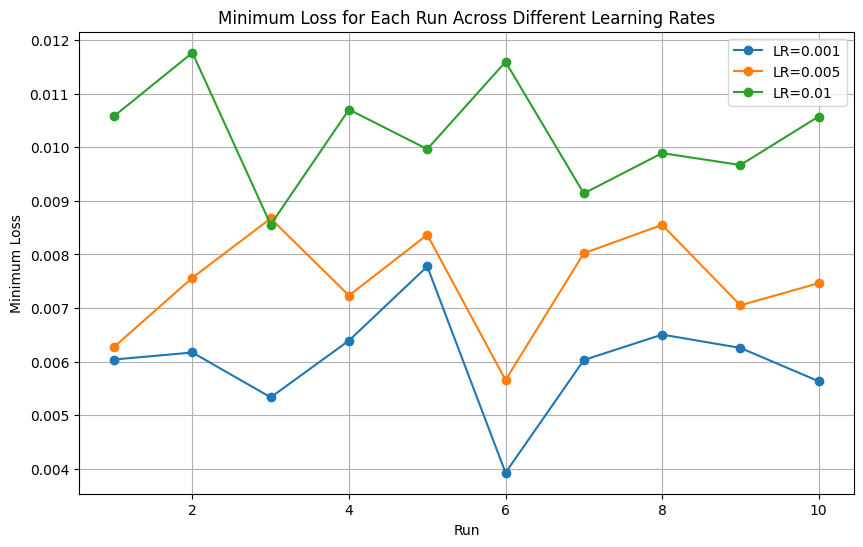

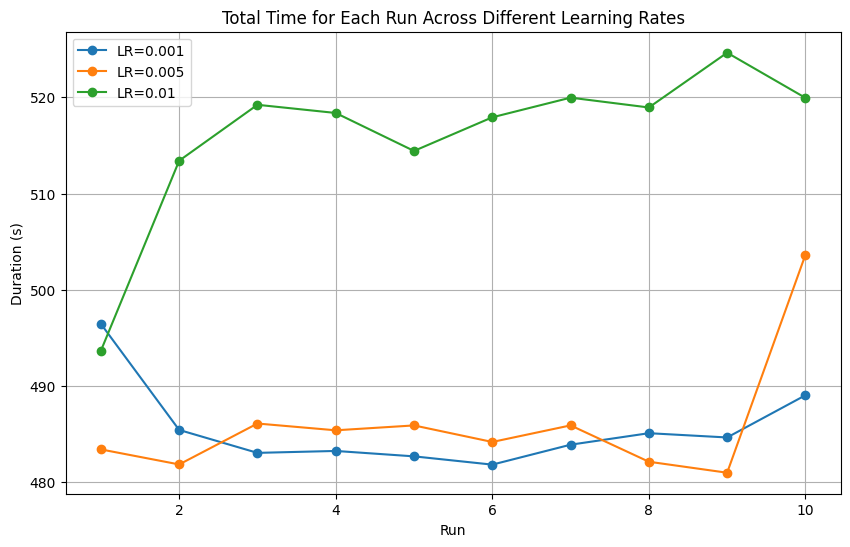

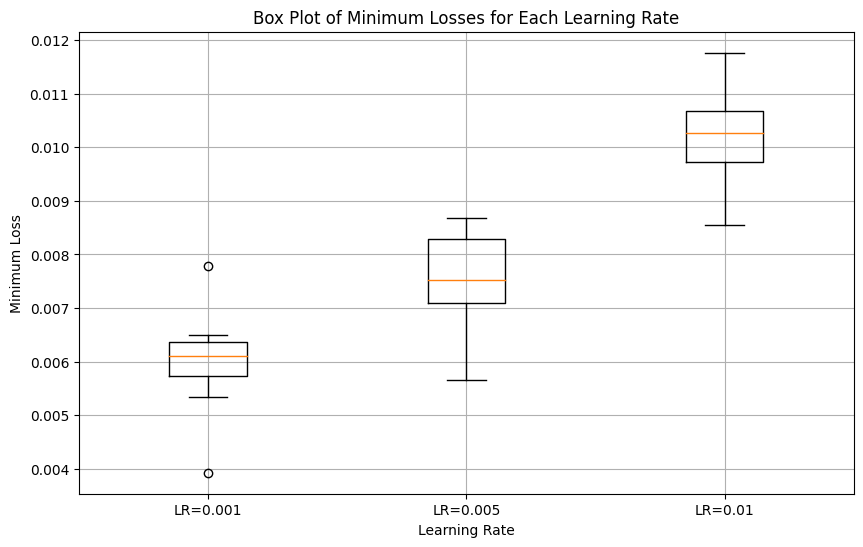

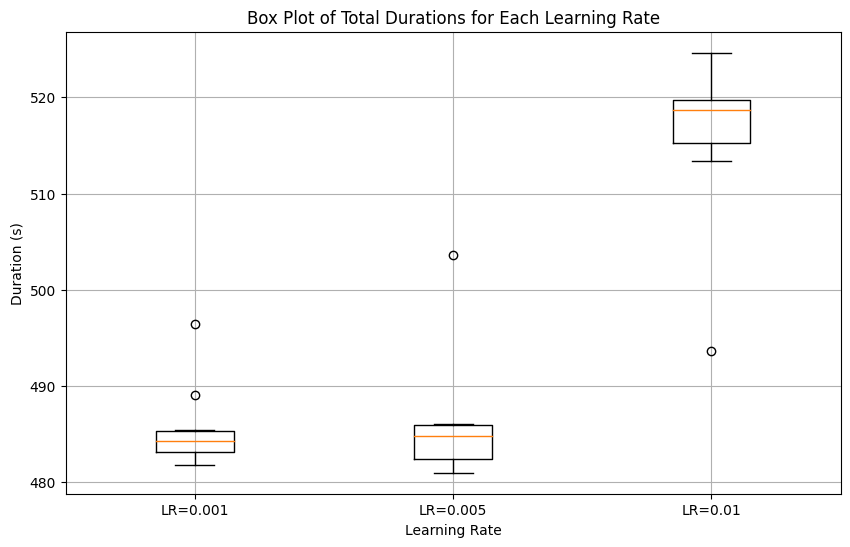

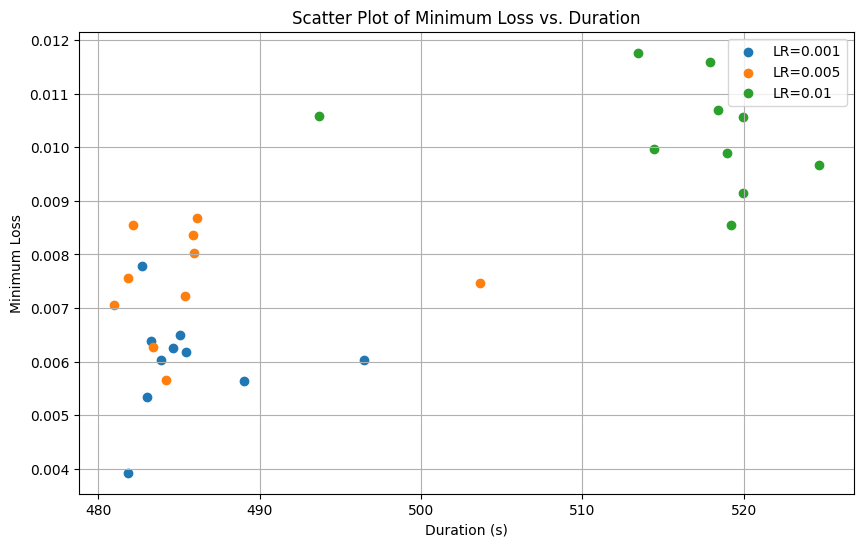

In [10]:
import matplotlib.pyplot as plt

# Assuming `results` is a list of lists with the structure [learning_rate, run, (min_loss, iteration), duration]

# Extract data for plotting
learning_rates = sorted(set(result[0] for result in results))
num_runs = len([result for result in results if result[0] == learning_rates[0]])

# Prepare data for plotting
loss_data = {lr: [] for lr in learning_rates}
time_data = {lr: [] for lr in learning_rates}

for result in results:
    lr, run, (min_loss, _), duration = result
    loss_data[lr].append(min_loss)
    time_data[lr].append(duration)

# Plot minimum loss for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), loss_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Minimum Loss')
plt.title('Minimum Loss for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Plot total time for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), time_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Duration (s)')
plt.title('Total Time for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Box plot of minimum losses
plt.figure(figsize=(10, 6))
plt.boxplot([loss_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Minimum Loss')
plt.title('Box Plot of Minimum Losses for Each Learning Rate')
plt.grid(True)
plt.show()

# Box plot of total durations
plt.figure(figsize=(10, 6))
plt.boxplot([time_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Duration (s)')
plt.title('Box Plot of Total Durations for Each Learning Rate')
plt.grid(True)
plt.show()

# Scatter plot of minimum loss vs. duration
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.scatter(time_data[lr], loss_data[lr], label=f'LR={lr}')
plt.xlabel('Duration (s)')
plt.ylabel('Minimum Loss')
plt.title('Scatter Plot of Minimum Loss vs. Duration')
plt.legend()
plt.grid(True)
plt.show()


[06/03 17:45:29 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


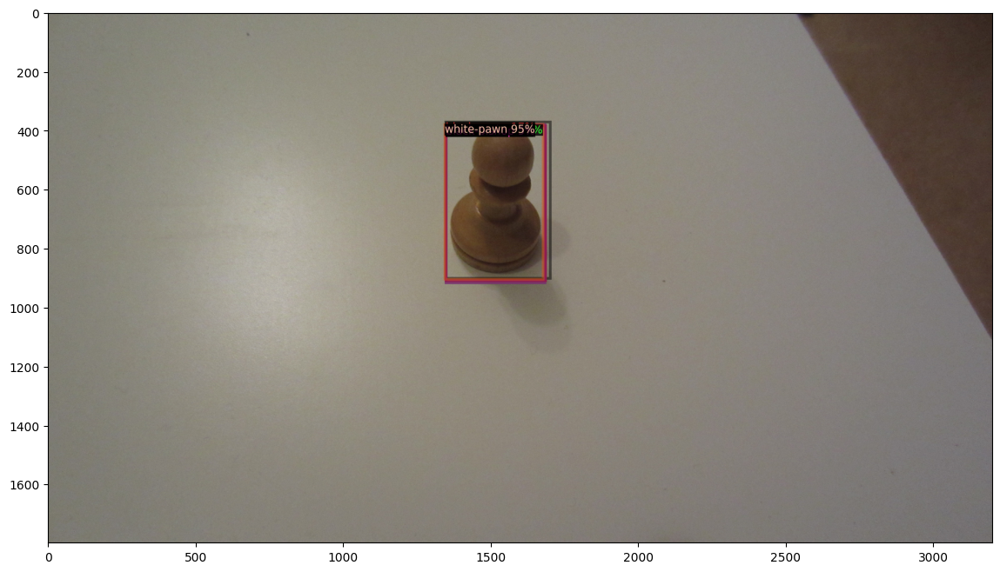

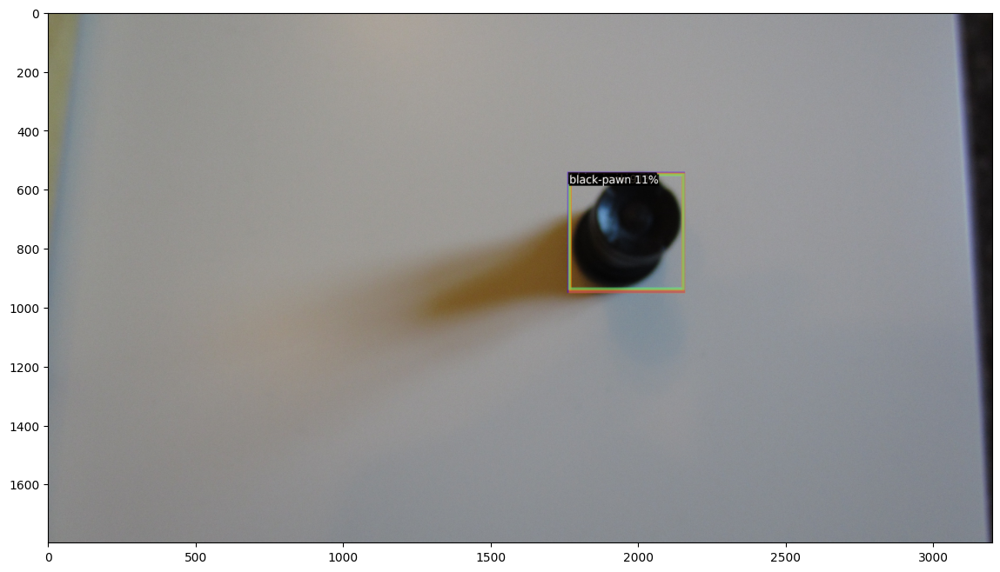

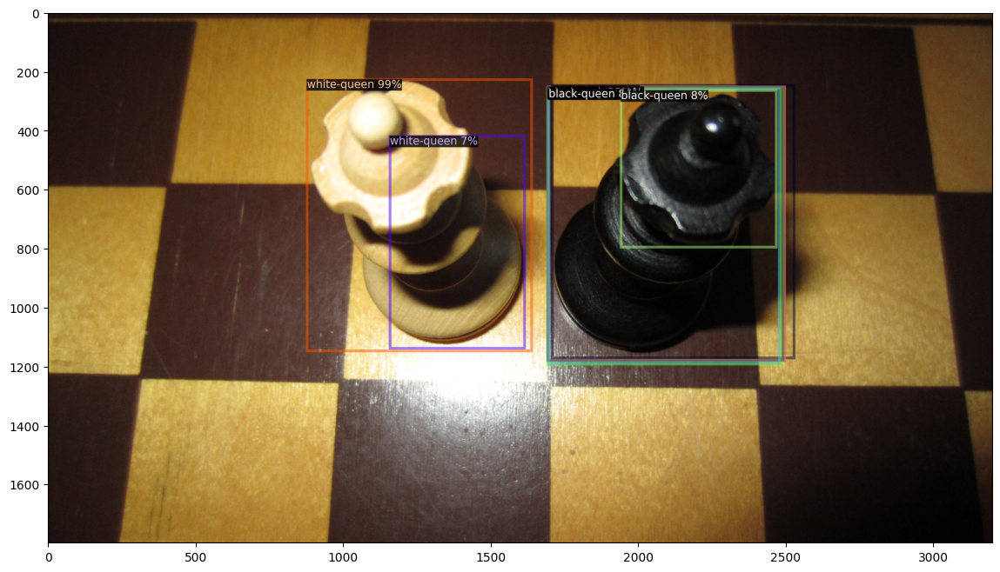

In [20]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # Set the testing threshold for this model
cfg.DATASETS.TEST = ("chess_piece_dataset", )
predictor = DefaultPredictor(cfg)

dataset_dicts = DatasetCatalog.get('chess_piece_dataset')
chess_metadata = MetadataCatalog.get('chess_piece_dataset')

for d in random.sample(dataset_dicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    try:
        v = Visualizer(im[:, :, ::-1], metadata=chess_metadata, scale=0.8)
        v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        plt.figure(figsize=(14, 10))
        plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
        plt.show()
    except IndexError:
        pass
